In [1]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import math

In [2]:
# Set up paths
SCRIPT_DIR_PATH = os.getcwd()
PROJECT_DIR_PATH = os.path.dirname(SCRIPT_DIR_PATH)
MODEL_DIR_PATH = os.path.join(PROJECT_DIR_PATH, 'model')
OUTPUTS_DIR_PATH = os.path.join(MODEL_DIR_PATH, 'outputs')
BASELINE_DIR_PATH = os.path.join(OUTPUTS_DIR_PATH, 'baseline')
ENSEMBLE_DIR_PATH = os.path.join(OUTPUTS_DIR_PATH, 'ensemble')
EXP_DESIGN_DIR_PATH = os.path.join(OUTPUTS_DIR_PATH, 'exp_design')
CONFIG_DIR_PATH = os.path.join(MODEL_DIR_PATH, 'python_ver/config')

In [3]:
def simple_line_plot(df, x, y, title, xlabel, ylabel):
    fig, ax = plt.subplots()
    df.plot(x=x, y=y, ax=ax)
    ax.set_title(title)
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    plt.grid(True)
    plt.show()
    plt.close()
   
    return None

In [4]:
import yaml
config_yaml_path = os.path.join(CONFIG_DIR_PATH, 'ensemble_config_6.yaml')

# Read the ensemble configuration file
with open(config_yaml_path, 'r') as file:
    config = yaml.safe_load(file)
# Extract the parameters from the configuration
model_parameters = config['model_parameters']
parameter_keys = list(model_parameters.keys())
parameter_keys


['k_SI',
 'ef_AC',
 'alpha_sat',
 'k_use',
 'k_coll_SI',
 'eps_SI_SC',
 'k_SC_decay',
 'k_coll_SC',
 'k_AC_growth',
 'k_AC_decay']

## Baseline Plots

In [5]:
baseline_df = pd.read_csv(os.path.join(BASELINE_DIR_PATH, 'baseline_config_6_output.csv'))
baseline_df.head()

,time,State_Inputs,State_Capacity,Administrative_Complexity
0,0.00,1.000000,0.5000,0.050000
1,0.01,1.000102,0.5004,0.050145
2,0.02,1.000205,0.5008,0.050290
3,0.03,1.000307,0.5012,0.050435
4,0.04,1.000410,0.5016,0.050581


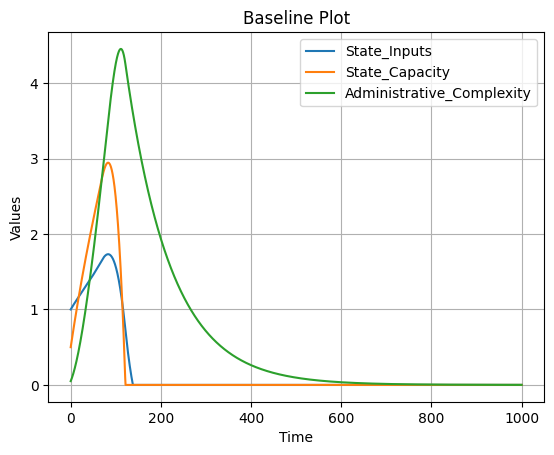

In [6]:
# state_variables = ["State_Inputs", "State_Capacity", "Administrative_Complexity", "State_Integrity", "Population"]
state_variables = ["State_Inputs", "State_Capacity", "Administrative_Complexity"]

# Plot the data
simple_line_plot(baseline_df, 'time', state_variables, 'Baseline Plot', 'Time', 'Values')

## Ensemble

In [7]:
output_df = pd.read_csv(os.path.join(ENSEMBLE_DIR_PATH, 'ensemble_config_6_output.csv'))
output_df.head()

,State_Inputs,State_Capacity,Administrative_Complexity,time,run_id
0,1.000000,0.500000,0.050000,0.0,1.0
1,1.002131,0.500653,0.051020,0.2,1.0
2,1.004260,0.501309,0.052039,0.4,1.0
3,1.006386,0.501967,0.053058,0.6,1.0
4,1.008508,0.502628,0.054077,0.8,1.0


In [8]:
output_df

,State_Inputs,State_Capacity,Administrative_Complexity,time,run_id
0,1.000000,0.500000,0.050000,0.0,1.0
1,1.002131,0.500653,0.051020,0.2,1.0
2,1.004260,0.501309,0.052039,0.4,1.0
3,1.006386,0.501967,0.053058,0.6,1.0
4,1.008508,0.502628,0.054077,0.8,1.0
...,...,...,...,...,...
250095,-0.000200,5.207427,31.956138,499.2,100.0
250096,-0.000200,5.204866,31.948330,499.4,100.0
250097,-0.000200,5.202305,31.940517,499.6,100.0
250098,-0.000200,5.199747,31.932698,499.8,100.0


In [9]:
# Load experiment data
exp_design_df = pd.read_csv(os.path.join(EXP_DESIGN_DIR_PATH, 'exp_design_ensemble_config_6_output.csv'))
exp_design_df.head()

,k_SI,ef_AC,alpha_sat,k_use,k_coll_SI,eps_SI_SC,k_SC_decay,k_coll_SC,k_AC_growth,k_AC_decay,run_id
0,0.589034,0.072748,0.341673,0.351246,0.864154,0.220654,0.777367,0.434866,0.367729,0.833315,1
1,0.102041,0.727121,0.458729,0.731854,0.420985,0.695829,0.956498,0.197978,0.511097,0.952719,2
2,0.248542,0.567632,0.101201,0.080979,0.481124,0.193654,0.324236,0.595745,0.478815,0.065192,3
3,0.721653,0.426684,0.150304,0.653981,0.788040,0.253542,0.693196,0.023706,0.206828,0.948715,4
4,0.090652,0.276519,0.912834,0.412873,0.301947,0.883423,0.589691,0.315553,0.128652,0.095292,5


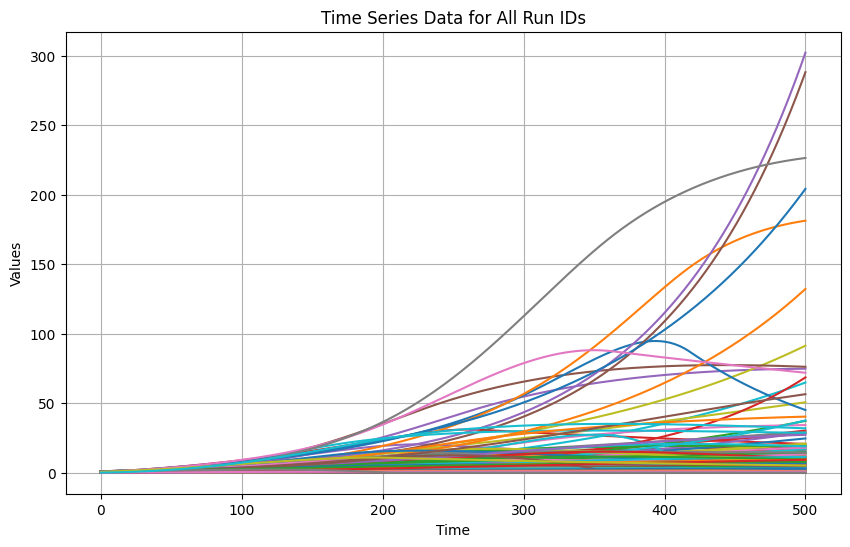

In [10]:
# Create a figure and axis
fig, ax = plt.subplots(figsize=(10, 6))

# Define the columns to plot
columns_to_plot = ["State_Inputs", "State_Capacity", "Administrative_Complexity"]

# Loop through each unique 'run_id'
for run_id in output_df['run_id'].unique():
    subset = output_df[output_df['run_id'] == run_id]
    for column in columns_to_plot:
        ax.plot(subset['time'], subset[column], label=f'{column} Run ID {run_id}')

# Adding plot title and labels
ax.set_title('Time Series Data for All Run IDs')
ax.set_xlabel('Time')
ax.set_ylabel('Values')
ax.grid(True)

# Show the plot
plt.show()

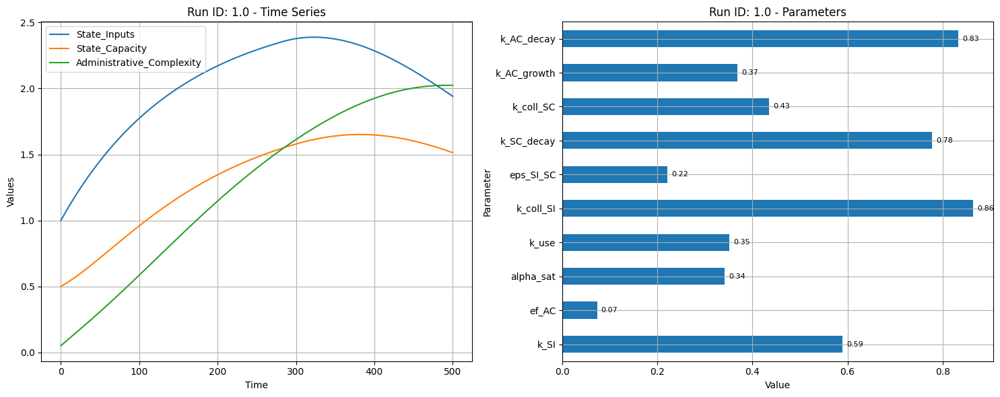

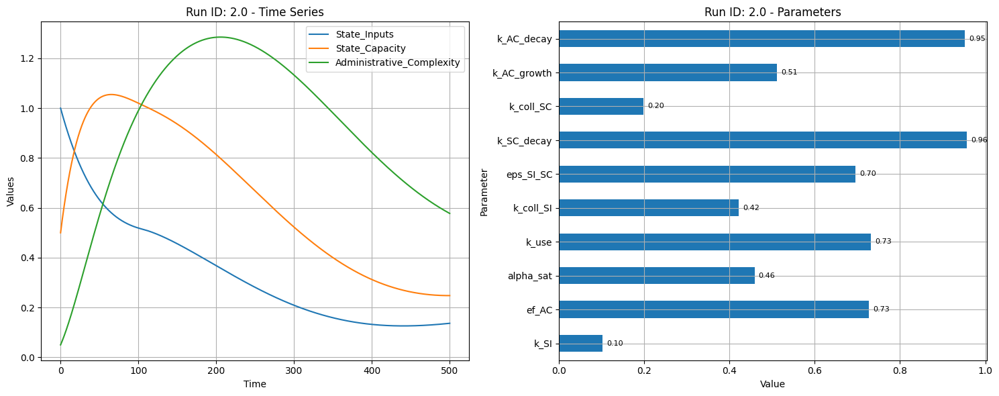

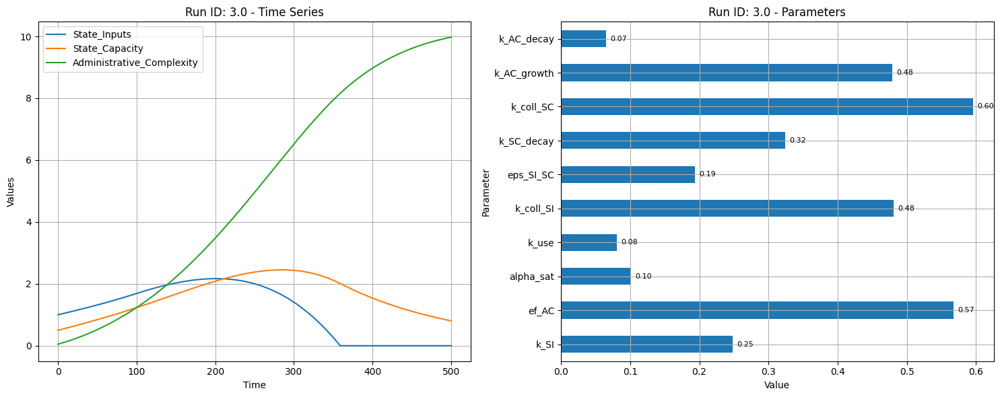

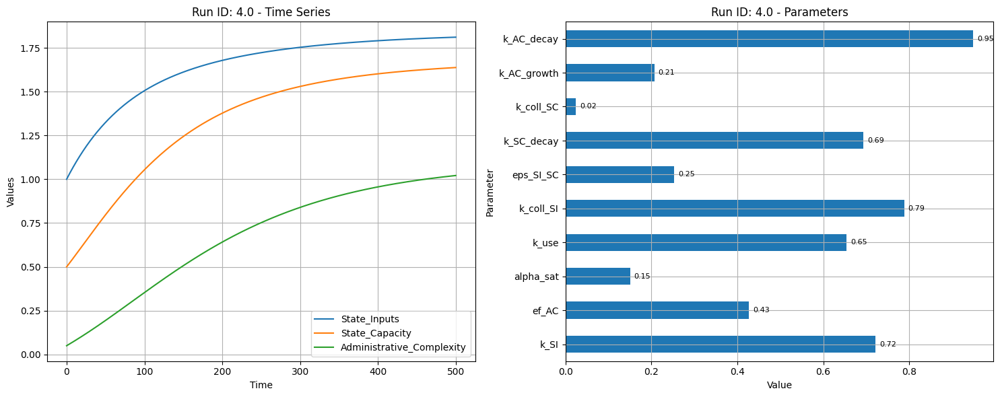

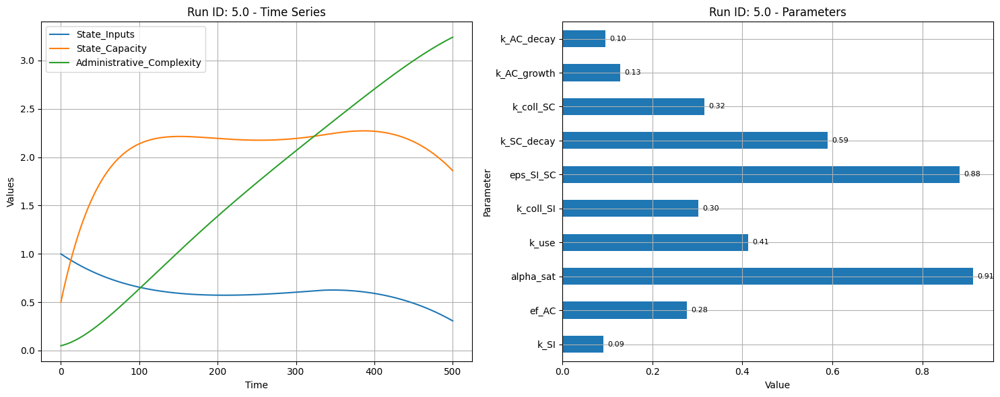

...

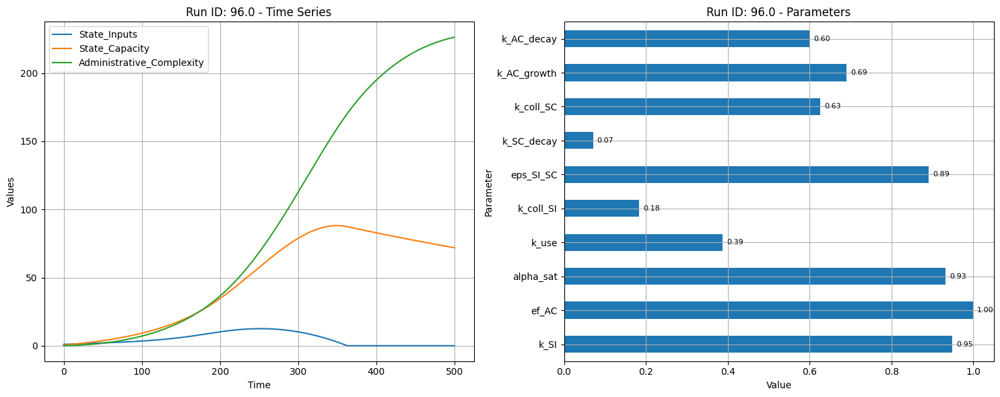

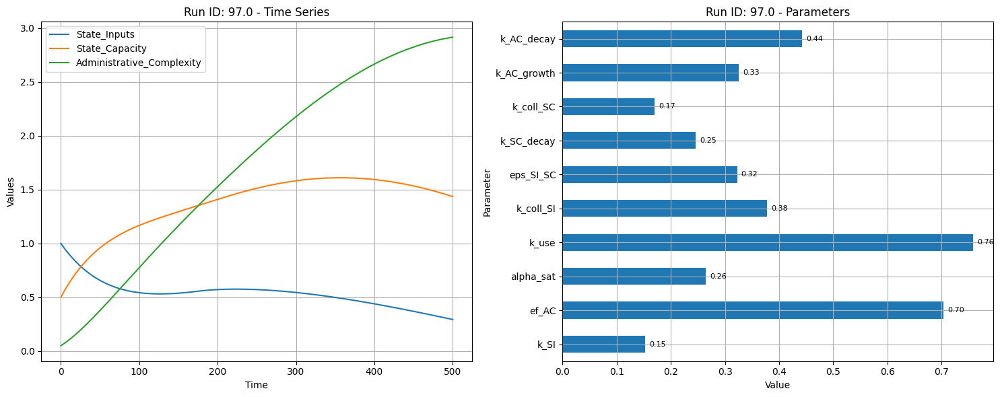

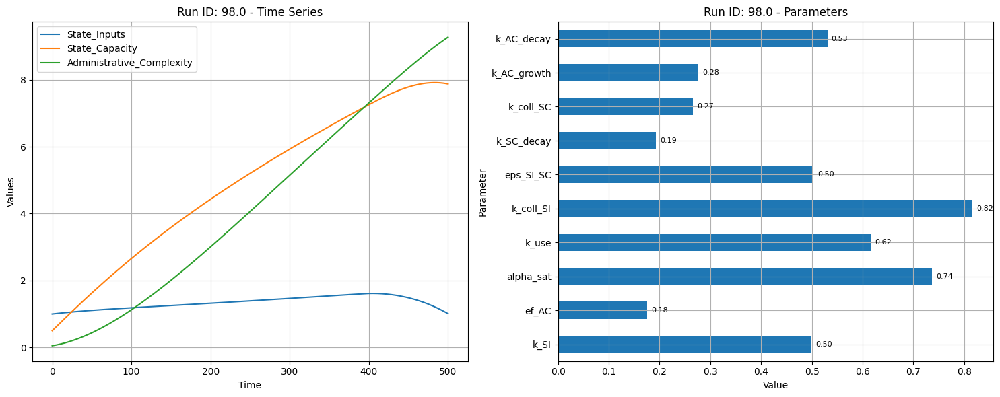

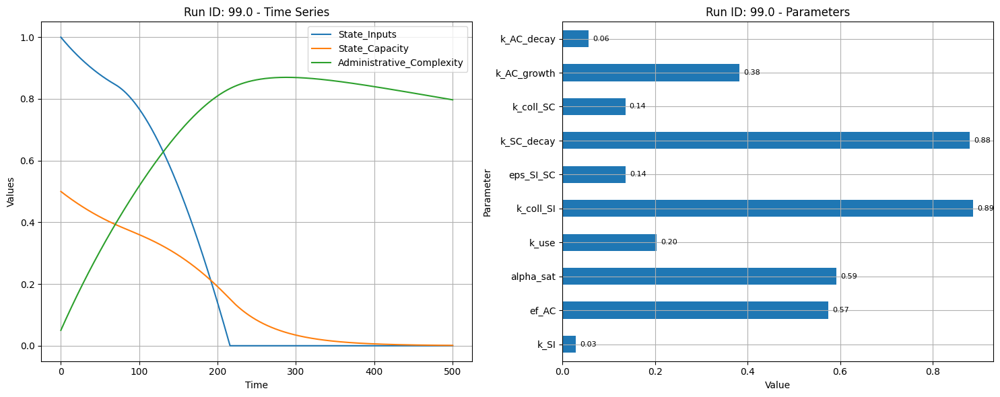

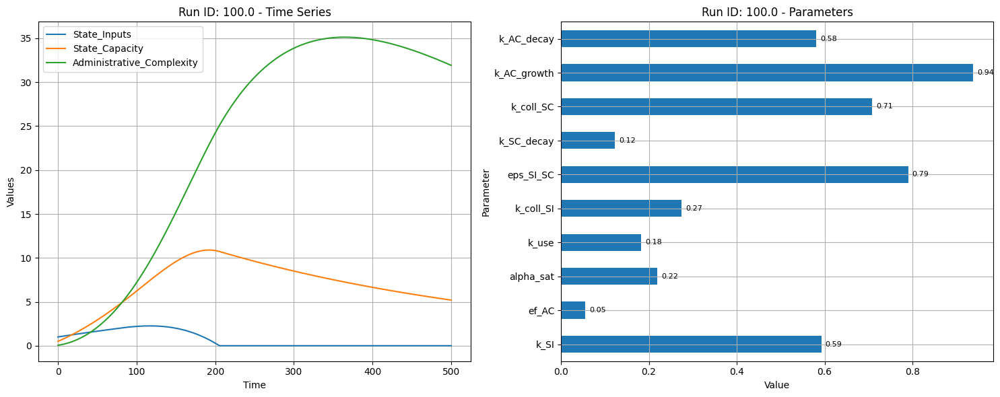

In [11]:
# Define the columns you want to plot.


stocks_to_plot = ["State_Inputs", "State_Capacity", "Administrative_Complexity"]

# Loop over each run_id and create one figure with two subplots.
for run_id in output_df['run_id'].unique():
    subset_output = output_df[output_df['run_id'] == run_id]
    subset_exp_design = exp_design_df[exp_design_df['run_id'] == run_id]
    
    # Create a figure with 1 row and 2 columns of subplots.
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))
    
    # Time series plot on the left subplot.
    subset_output.plot(x='time', y=stocks_to_plot, ax=ax1, title=f'Run ID: {run_id} - Time Series')
    ax1.set_xlabel('Time')
    ax1.set_ylabel('Values')
    ax1.legend()
    ax1.grid(True)
    
    # Horizontal bar plot on the right subplot.
    # Use the first row of exp_design data for this run_id.
    data_bar = subset_exp_design[parameter_keys].iloc[0]
    data_bar.plot(kind='barh', ax=ax2, title=f'Run ID: {run_id} - Parameters')
    ax2.set_xlabel('Value')
    ax2.set_ylabel('Parameter')
    ax2.grid(True)
    
    # Add labels to each bar with the actual value.
    # Compute an offset relative to the maximum value so the text doesn't overlap the bar.
    offset = data_bar.max() * 0.01  
    for patch in ax2.patches:
        ax2.text(patch.get_width() + offset, 
                 patch.get_y() + patch.get_height() / 2,
                 f'{patch.get_width():.2f}', 
                 ha='left', va='center', fontsize=8)
    
    plt.tight_layout()
    plt.show()


In [12]:
# for run_id in output_df['run_id'].unique():
#     subset = output_df[output_df['run_id'] == run_id]
#     subset.plot(x='time', y=columns_to_plot, figsize=(10, 6), title=f'Run ID: {run_id}')
#     plt.xlabel('Time')
#     plt.ylabel('Values')
#     plt.legend()
#     plt.grid(True)
#     plt.show()


In [13]:
# for run_id in output_df['run_id'].unique():
#     subset = output_df[(output_df['run_id'] == run_id) & (output_df['time'] < 10)]
#     subset.plot(x='time', y=columns_to_plot, figsize=(10, 6), title=f'Run ID: {run_id}')
#     plt.xlabel('Time')
#     plt.ylabel('Values')
#     plt.legend()
#     plt.grid(True)
#     plt.show()
